<a href="https://colab.research.google.com/github/1eetnals/Child-abuse-detection-system-using-TEN4FACESp/blob/main/super_resolution_sub_pixel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://keras.io/examples/vision/super_resolution_sub_pixel/


## Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import cv2

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory
from google.colab.patches import cv2_imshow

from IPython.display import display

## Load data: BSDS500 dataset

### Download dataset

We use the built-in `keras.utils.get_file` utility to retrieve the dataset.

In [ ]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

70778880/70763455 [==============================] - 2s 0us/step


We create training and validation datasets via `image_dataset_from_directory`.

In [ ]:
crop_size = 300
upscale_factor = 3   #3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


We rescale the images to take values in the range [0, 1].

In [ ]:

def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

Let's visualize a few sample images:

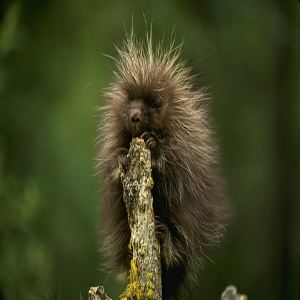

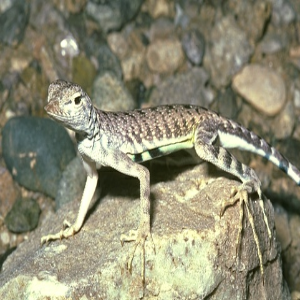

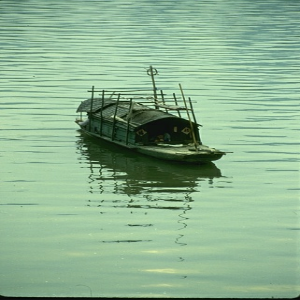

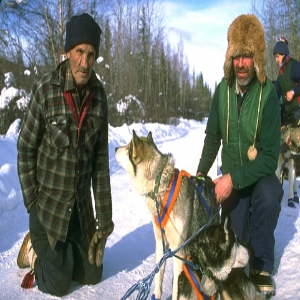

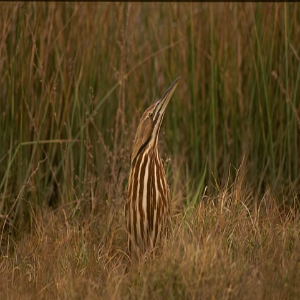

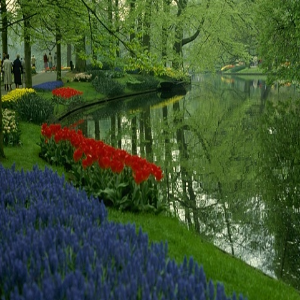

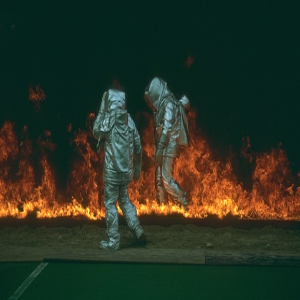

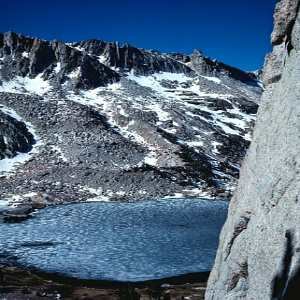

In [ ]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

We prepare a dataset of test image paths that we will use for
visual evaluation at the end of this example.

In [ ]:
#dataset = os.path.join(root_dir, "images")
#test_path = os.path.join(dataset, "test")
test_path = '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test'


test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)
test_img_paths

['/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_700.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_701.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_702.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_703.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_704.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_705.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_706.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_707.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_708.jpg',
 '/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/face_data_test/normal_face_

## Crop and resize images

Let's process image data.
First, we convert our images from the RGB color space to the
[YUV colour space](https://en.wikipedia.org/wiki/YUV).

For the input data (low-resolution images),
we crop the image, retrieve the `y` channel (luninance),
and resize it with the `area` method (use `BICUBIC` if you use PIL).
We only consider the luminance channel
in the YUV color space because humans are more sensitive to
luminance change.

For the target data (high-resolution images), we just crop the image
and retrieve the `y` channel.

In [ ]:

# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

Let's take a look at the input and target data.

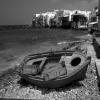

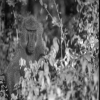

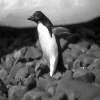

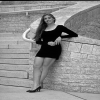

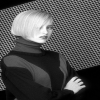

...

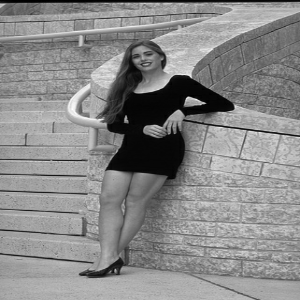

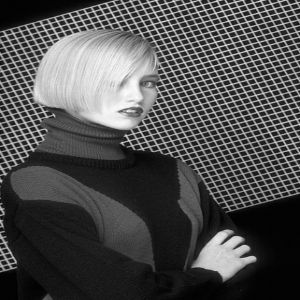

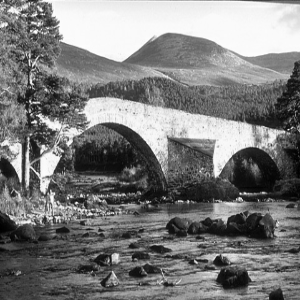

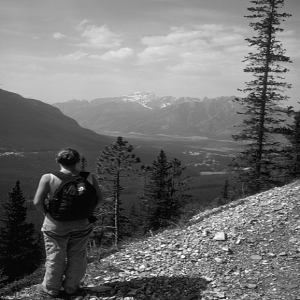

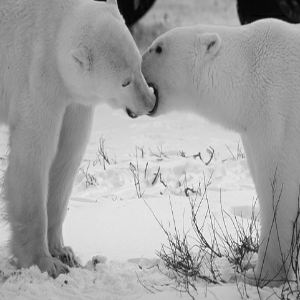

In [ ]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

## Build a model

Compared to the paper, we add one more layer and we use the `relu` activation function
instead of `tanh`.
It achieves better performance even though we train the model for fewer epochs.

In [ ]:

def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)


## Define utility functions

We need to define several utility functions to monitor our results:

- `plot_results` to plot an save an image.
- `get_lowres_image` to convert an image to its low-resolution version.
- `upscale_image` to turn a low-resolution image to
a high-resolution version reconstructed by the model.
In this function, we use the `y` channel from the YUV color space
as input to the model and then combine the output with the
other channels to obtain an RGB image.

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


## Define callbacks to monitor training

The `ESPCNCallback` object will compute and display
the [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) metric.
This is the main metric we use to evaluate super-resolution performance.

In [ ]:

class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))


Define `ModelCheckpoint` and `EarlyStopping` callbacks.

In [ ]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/checkpoint2"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d (Conv2D)             (None, None, None, 64)    1664      
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 conv2d_3 (Conv2D)           (None, None, None, 9)     2601      
                                                                 
 tf.nn.depth_to_space (TFOpL  (None, None, None, 1)    0         
 ambda)                                                          
                                                             

## Train the model

Epoch 1/200
Mean PSNR for epoch: 22.17


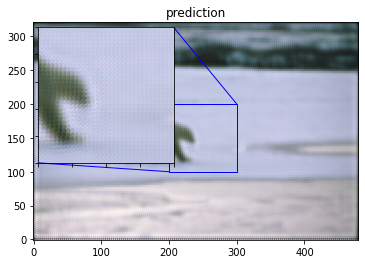

50/50 - 15s - loss: 0.0206 - val_loss: 0.0061 - 15s/epoch - 308ms/step
Epoch 2/200
Mean PSNR for epoch: 24.71
50/50 - 2s - loss: 0.0047 - val_loss: 0.0033 - 2s/epoch - 42ms/step
Epoch 3/200
Mean PSNR for epoch: 25.70
50/50 - 2s - loss: 0.0033 - val_loss: 0.0028 - 2s/epoch - 36ms/step
Epoch 4/200
Mean PSNR for epoch: 25.94
50/50 - 2s - loss: 0.0031 - val_loss: 0.0028 - 2s/epoch - 42ms/step
Epoch 5/200
Mean PSNR for epoch: 25.98
50/50 - 2s - loss: 0.0029 - val_loss: 0.0026 - 2s/epoch - 36ms/step
Epoch 6/200
Mean PSNR for epoch: 26.24
50/50 - 2s - loss: 0.0029 - val_loss: 0.0025 - 2s/epoch - 37ms/step
Epoch 7/200
Mean PSNR for epoch: 26.22
50/50 - 2s - loss: 0.0029 - val_loss: 0.0025 - 2s/epoch - 36ms/step
Epoch 8/200
Mean PSNR for epoch: 26.24
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 37ms/step
Epoch 9/200
Mean PSNR for epoch: 26.31
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 36ms/step
Epoch 10/200
Mean PSNR for epoch: 26.21
50/50 - 2s - loss: 0.0028 - val_l

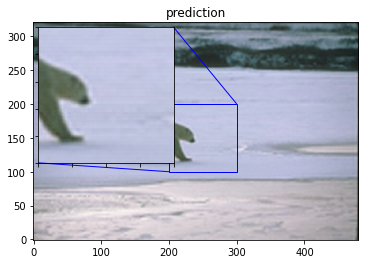

50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 48ms/step
Epoch 22/200
Mean PSNR for epoch: 26.15
50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 35ms/step
Epoch 23/200
Mean PSNR for epoch: 26.54
50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 35ms/step
Epoch 24/200
Mean PSNR for epoch: 26.61
50/50 - 2s - loss: 0.0028 - val_loss: 0.0024 - 2s/epoch - 41ms/step
Epoch 25/200
Mean PSNR for epoch: 27.00
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 42ms/step
Epoch 26/200
Mean PSNR for epoch: 26.29
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 27/200
Mean PSNR for epoch: 27.18
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 34ms/step
Epoch 28/200
Mean PSNR for epoch: 26.47
50/50 - 2s - loss: 0.0026 - val_loss: 0.0024 - 2s/epoch - 35ms/step
Epoch 29/200
Mean PSNR for epoch: 26.61
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 30/200
Mean PSNR for epoch: 26.36
50/50 - 2s - loss: 0.0026 - 

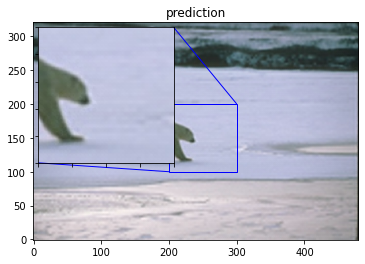

50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 49ms/step
Epoch 42/200
Mean PSNR for epoch: 26.68
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 43/200
Mean PSNR for epoch: 26.81
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 37ms/step
Epoch 44/200
Mean PSNR for epoch: 26.82
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 35ms/step
Epoch 45/200
Mean PSNR for epoch: 26.45
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 46/200
Mean PSNR for epoch: 26.24
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 47/200
Mean PSNR for epoch: 26.54
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 35ms/step
Epoch 48/200
Mean PSNR for epoch: 26.33
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 41ms/step
Epoch 49/200
Mean PSNR for epoch: 26.51
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 50/200
Mean PSNR for epoch: 26.41
50/50 - 2s - loss: 0.0026 - 

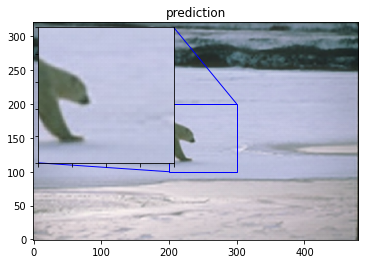

50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 48ms/step
Epoch 62/200
Mean PSNR for epoch: 26.25
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 63/200
Mean PSNR for epoch: 26.34
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 46ms/step
Epoch 64/200
Mean PSNR for epoch: 27.32
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 46ms/step
Epoch 65/200
Mean PSNR for epoch: 26.88
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 66/200
Mean PSNR for epoch: 24.51
50/50 - 2s - loss: 0.0026 - val_loss: 0.0036 - 2s/epoch - 34ms/step
Epoch 67/200
Mean PSNR for epoch: 26.61
50/50 - 2s - loss: 0.0029 - val_loss: 0.0023 - 2s/epoch - 35ms/step
Epoch 68/200
Mean PSNR for epoch: 26.68
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 35ms/step
Epoch 69/200
Mean PSNR for epoch: 26.44
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 70/200
Mean PSNR for epoch: 26.70
50/50 - 2s - loss: 0.0025 - 

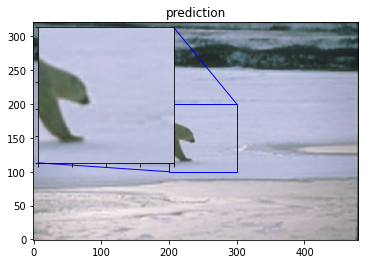

50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 52ms/step
Epoch 82/200
Mean PSNR for epoch: 26.64
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 43ms/step
Epoch 83/200
Mean PSNR for epoch: 26.84
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 84/200
Mean PSNR for epoch: 26.68
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 85/200
Mean PSNR for epoch: 26.83
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 35ms/step
Epoch 86/200
Mean PSNR for epoch: 26.17
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 87/200
Mean PSNR for epoch: 26.29
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 35ms/step
Epoch 88/200
Mean PSNR for epoch: 26.25
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 89/200
Mean PSNR for epoch: 26.57
50/50 - 2s - loss: 0.0026 - val_loss: 0.0022 - 2s/epoch - 35ms/step
Epoch 90/200
Mean PSNR for epoch: 26.36
50/50 - 2s - loss: 0.0025 - 

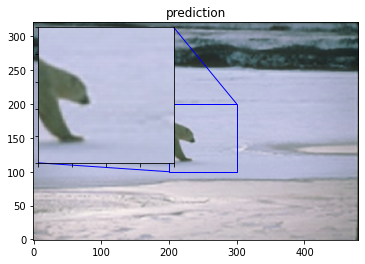

50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 49ms/step
Epoch 102/200
Mean PSNR for epoch: 26.61
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 37ms/step
Epoch 103/200
Mean PSNR for epoch: 26.50
50/50 - 2s - loss: 0.0025 - val_loss: 0.0024 - 2s/epoch - 35ms/step
Epoch 104/200
Mean PSNR for epoch: 26.79
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 105/200
Mean PSNR for epoch: 26.76
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 42ms/step
Epoch 106/200
Mean PSNR for epoch: 26.52
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 107/200
Mean PSNR for epoch: 26.86
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 36ms/step
Epoch 108/200
Mean PSNR for epoch: 26.41
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 37ms/step
Epoch 109/200
Mean PSNR for epoch: 26.39
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 41ms/step
Epoch 110/200
Mean PSNR for epoch: 27.29
50/50 - 2s - loss: 

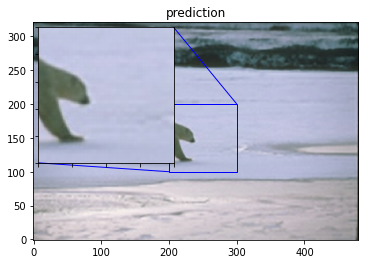

50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 49ms/step
Epoch 122/200
Mean PSNR for epoch: 26.72
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 35ms/step
Epoch 123/200
Mean PSNR for epoch: 26.22
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 35ms/step
Epoch 124/200
Mean PSNR for epoch: 26.93
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 35ms/step
Epoch 125/200
Mean PSNR for epoch: 26.47
50/50 - 2s - loss: 0.0026 - val_loss: 0.0024 - 2s/epoch - 35ms/step
Epoch 126/200
Mean PSNR for epoch: 26.78
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 35ms/step
Epoch 127/200
Mean PSNR for epoch: 26.82
50/50 - 2s - loss: 0.0024 - val_loss: 0.0022 - 2s/epoch - 35ms/step


In [ ]:
epochs = 200 #100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

## Run model prediction and plot the results

Let's compute the reconstructed version of a few images and save the results.

In [ ]:
model.load_weights(checkpoint_filepath)

(99, 99, 3)
(99, 99, 3)
(99, 99, 3)
PSNR of low resolution image and high resolution image is 27.0008
PSNR of predict and high resolution is 28.1569


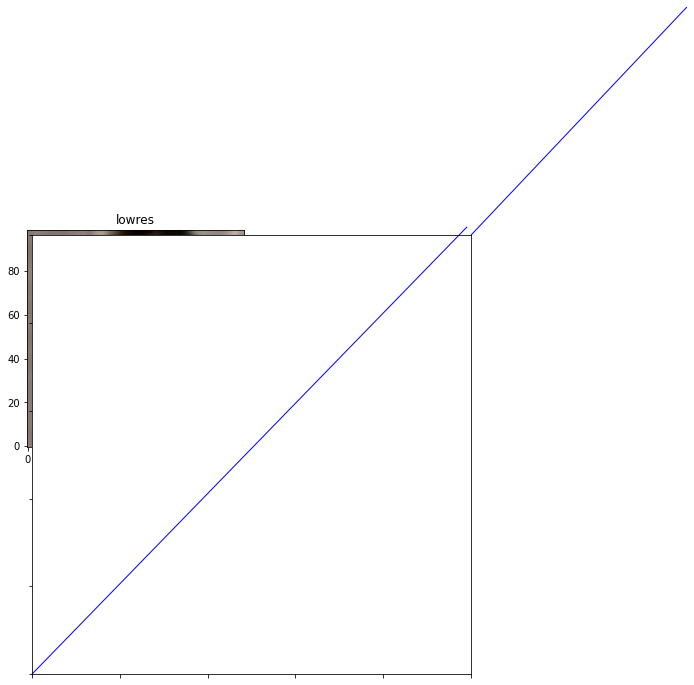

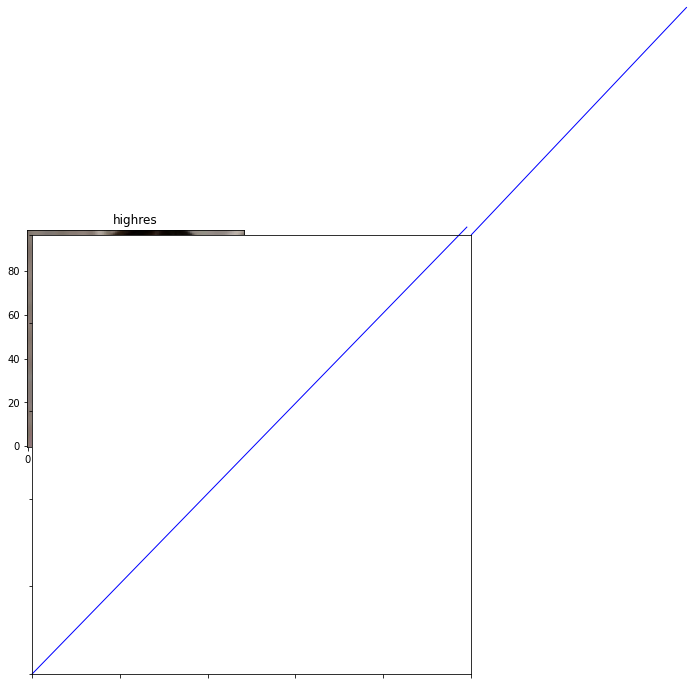

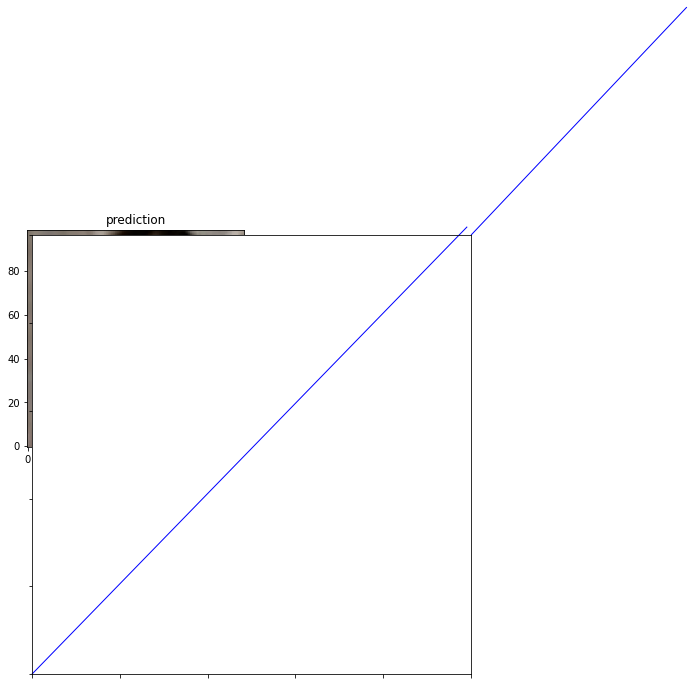

(99, 99, 3)
(99, 99, 3)
(99, 99, 3)
PSNR of low resolution image and high resolution image is 28.3431
PSNR of predict and high resolution is 29.3687


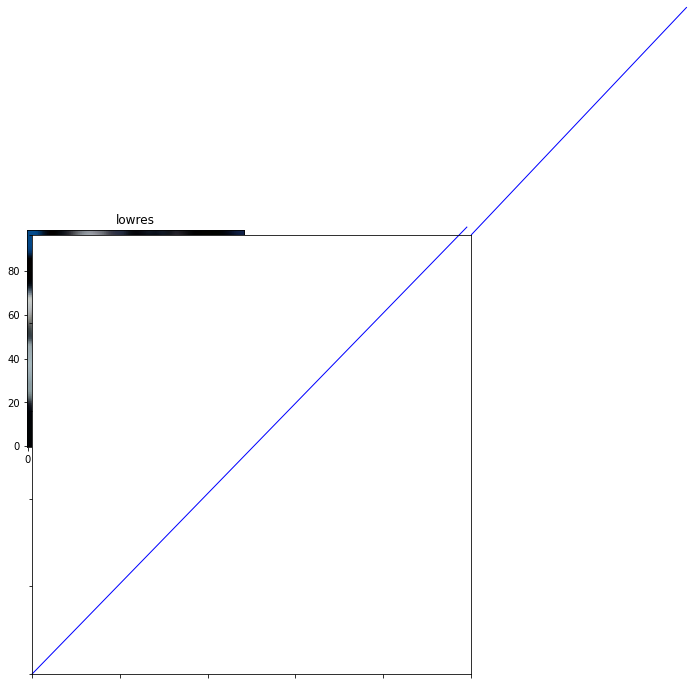

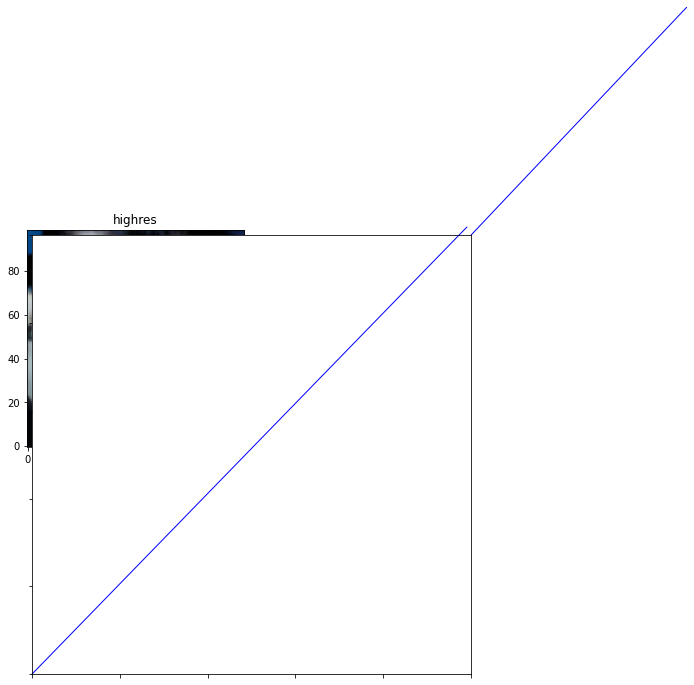

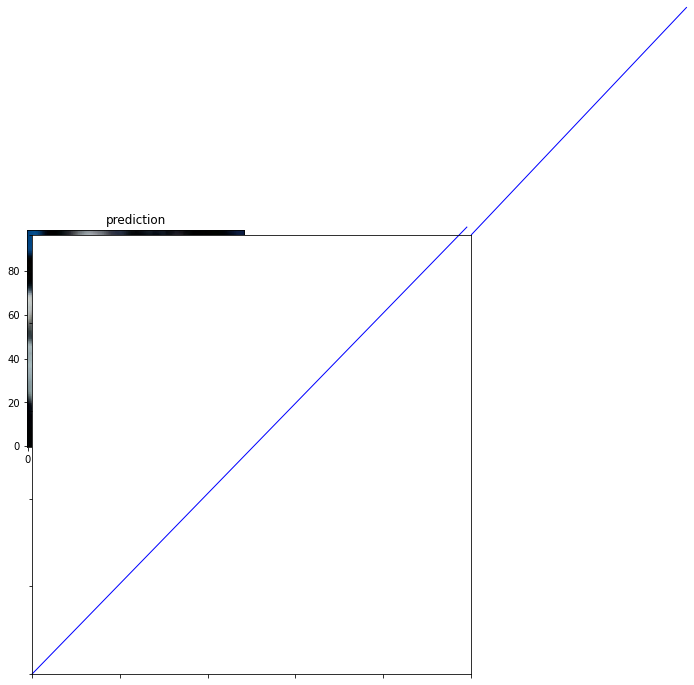

(249, 249, 3)
(249, 249, 3)
(249, 249, 3)
PSNR of low resolution image and high resolution image is 32.3869
PSNR of predict and high resolution is 34.9412


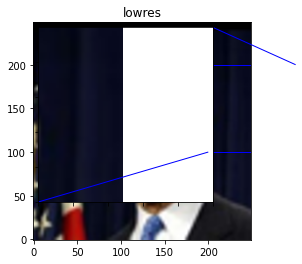

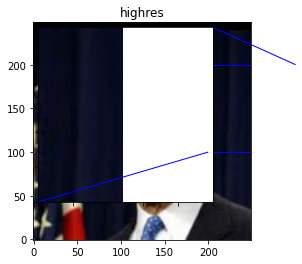

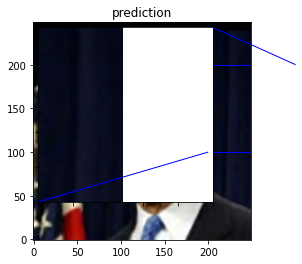

(99, 99, 3)
(99, 99, 3)
(99, 99, 3)
PSNR of low resolution image and high resolution image is 26.1997
PSNR of predict and high resolution is 27.4964


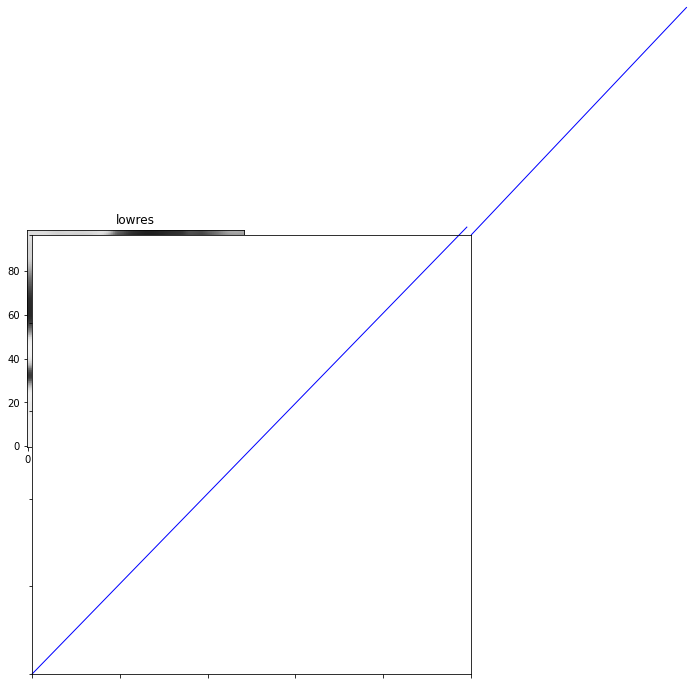

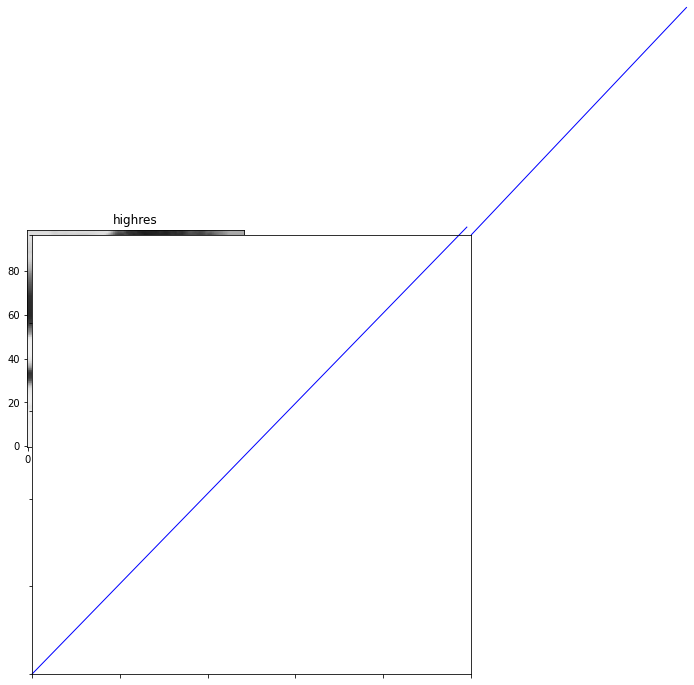

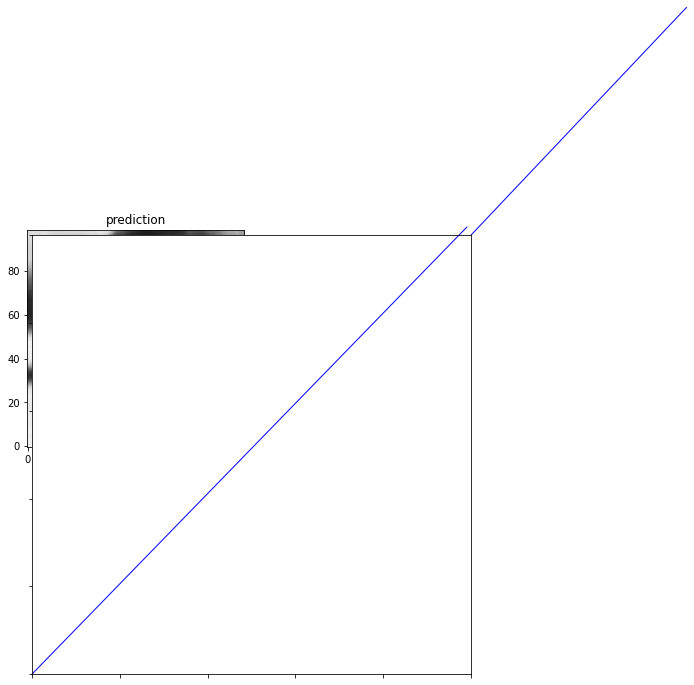

(249, 249, 3)
(249, 249, 3)
(249, 249, 3)
PSNR of low resolution image and high resolution image is 29.9171
PSNR of predict and high resolution is 33.1118


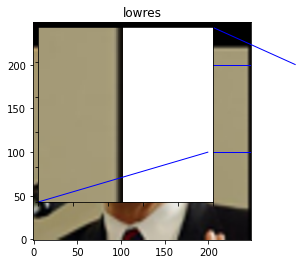

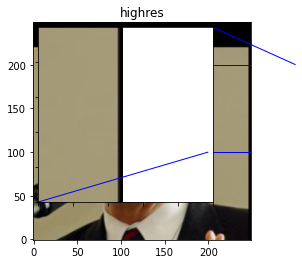

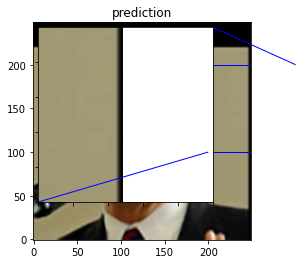

(249, 249, 3)
(249, 249, 3)
(249, 249, 3)
PSNR of low resolution image and high resolution image is 32.1348
PSNR of predict and high resolution is 34.0356


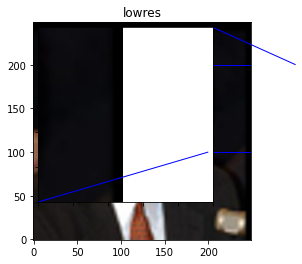

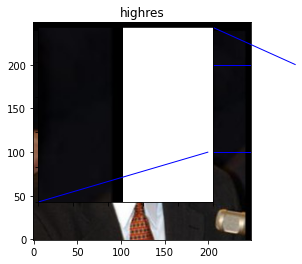

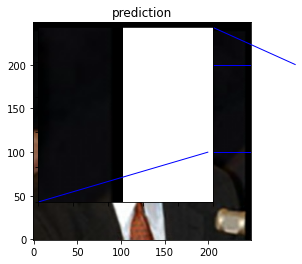

(249, 249, 3)
(249, 249, 3)
(249, 249, 3)
PSNR of low resolution image and high resolution image is 31.9573
PSNR of predict and high resolution is 34.0718


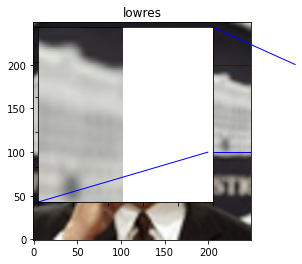

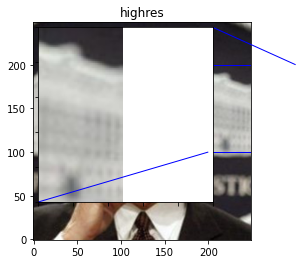

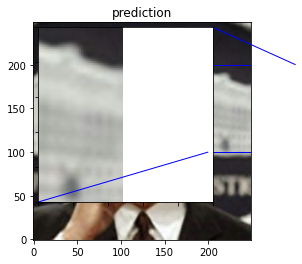

(249, 249, 3)
(249, 249, 3)
(249, 249, 3)
PSNR of low resolution image and high resolution image is 28.5768
PSNR of predict and high resolution is 30.3429


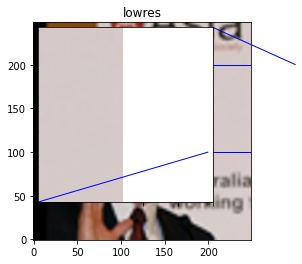

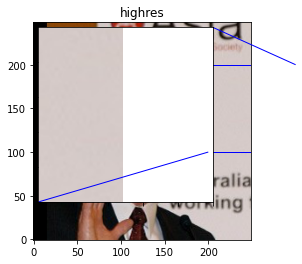

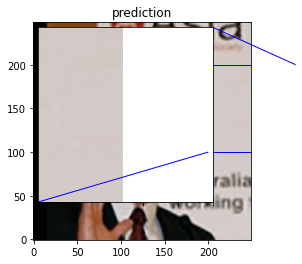

(249, 249, 3)
(249, 249, 3)
(249, 249, 3)
PSNR of low resolution image and high resolution image is 32.8533
PSNR of predict and high resolution is 34.2379


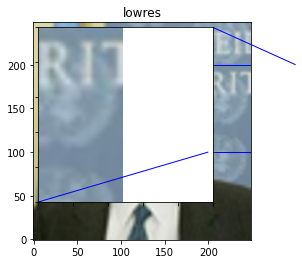

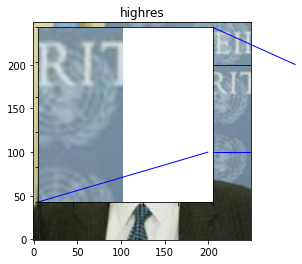

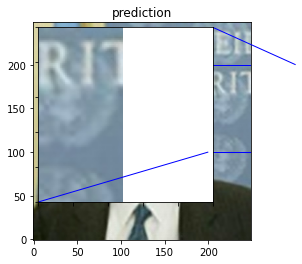

(366, 270, 3)
(366, 270, 3)
(366, 270, 3)
PSNR of low resolution image and high resolution image is 34.4291
PSNR of predict and high resolution is 35.3414


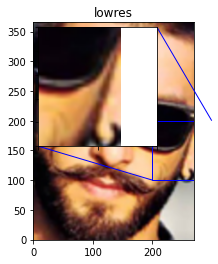

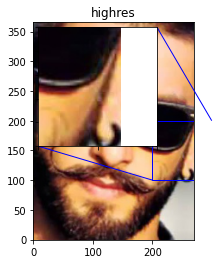

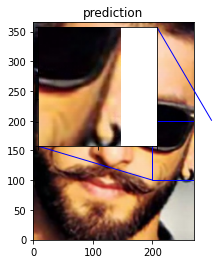

Avg. PSNR of lowres images is 30.3799
Avg. PSNR of reconstructions is 32.1104


In [ ]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[:]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    print(lowres_img_arr.shape)
    print(highres_img_arr.shape)
    print(predict_img_arr.shape)

    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")



print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

## 우리 데이터에 적용

In [ ]:
#파일에 있는 이미지 싹다 돌리기

path = '/content/drive/Shareddrives/BME캡스톤/data/data_final/eye_bruise_diagnosis/eyes_bruise/'
file = os.listdir(path)
print(len(file))

214


(504, 795, 3)
(504, 795, 3)


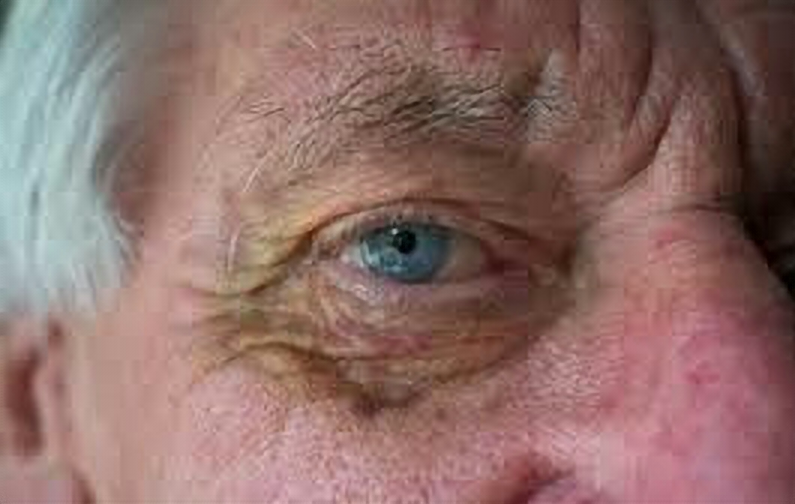

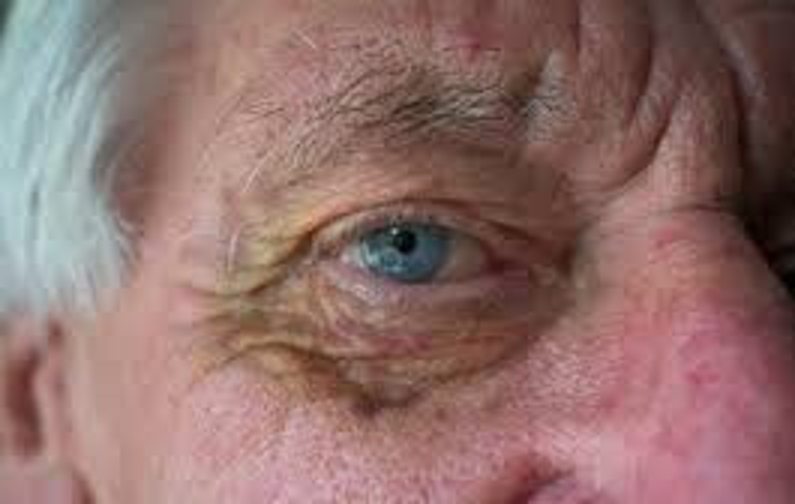

(549, 825, 3)
(549, 825, 3)


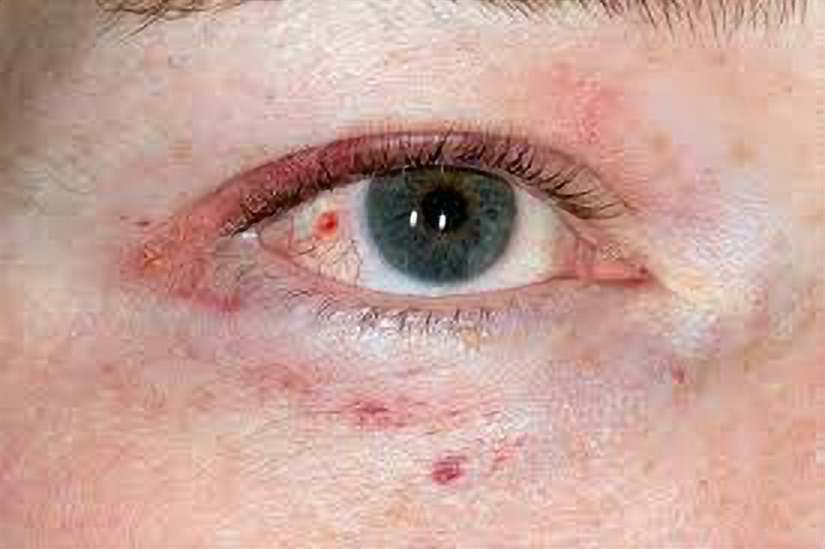

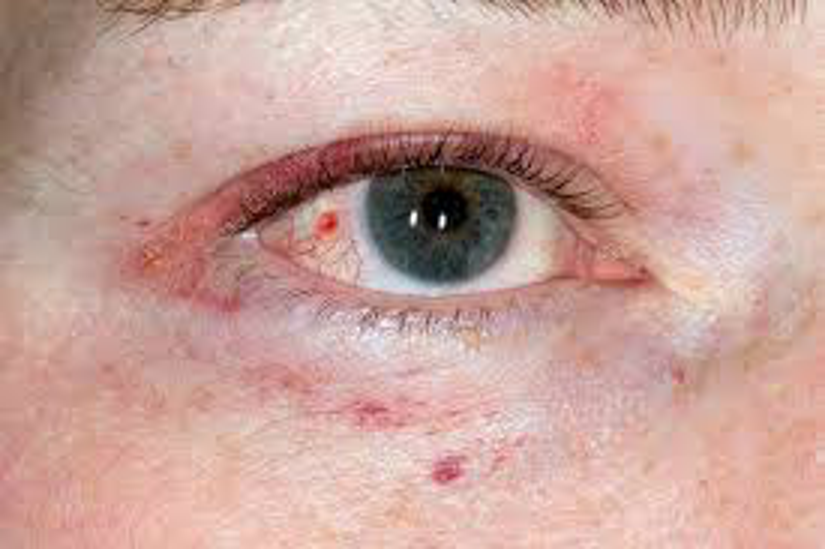

(360, 1002, 3)
(360, 1002, 3)


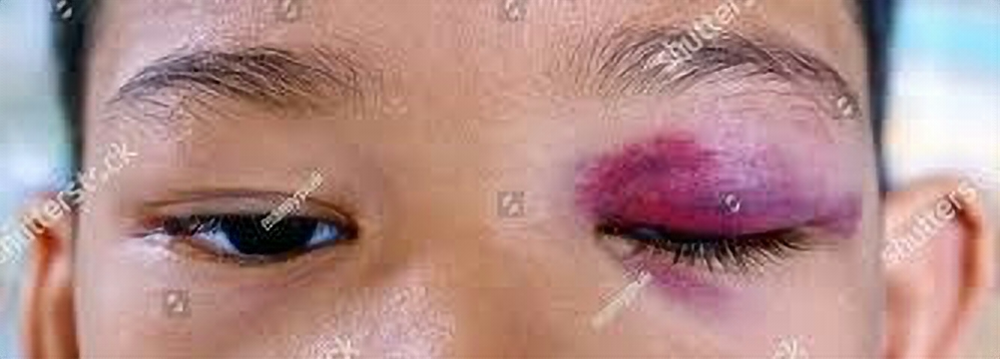

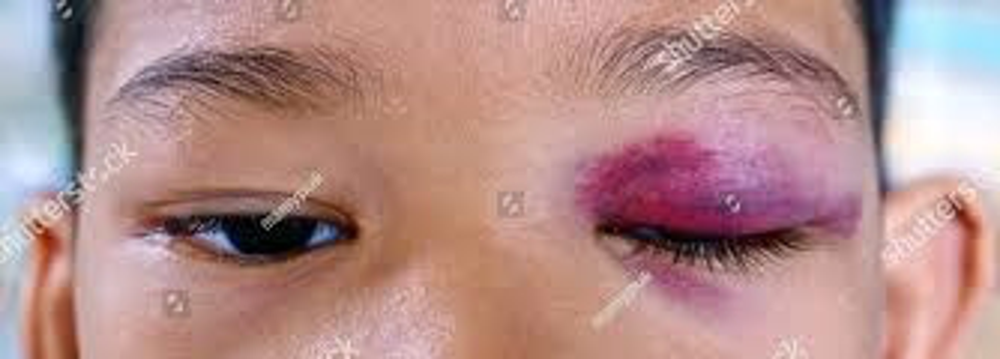

(543, 837, 3)
(543, 837, 3)


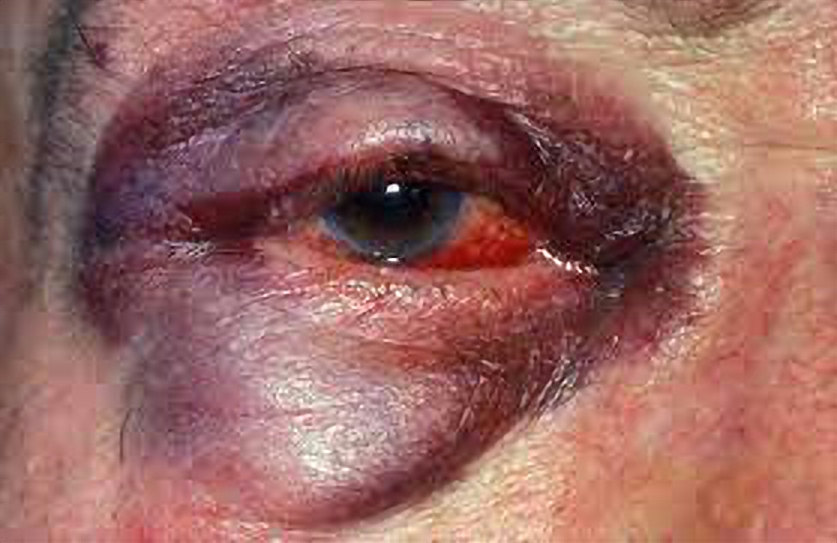

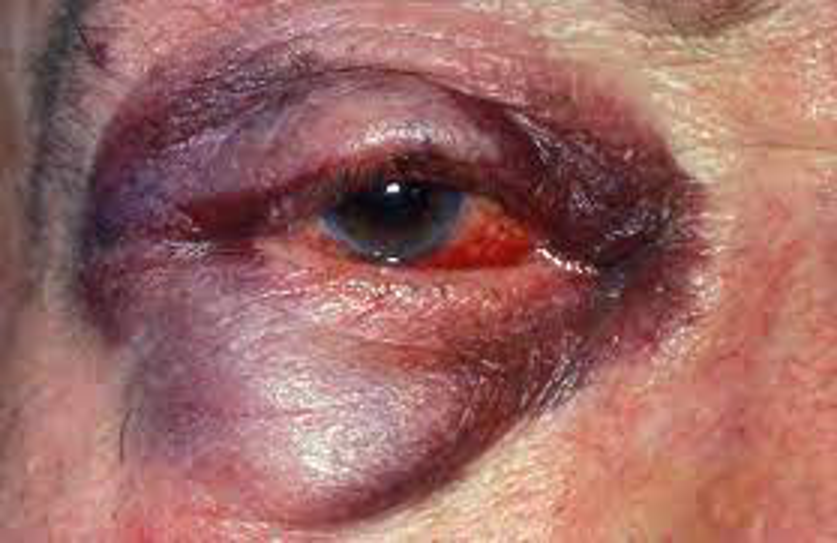

(549, 828, 3)
(549, 828, 3)


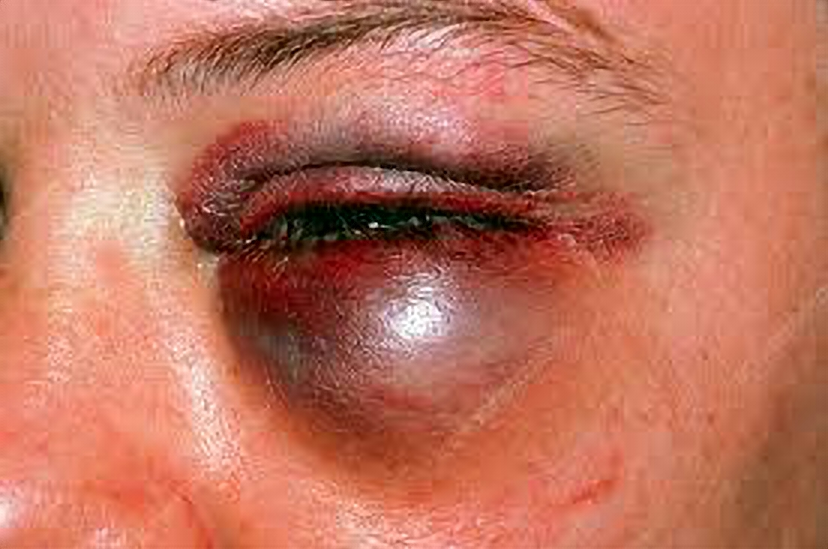

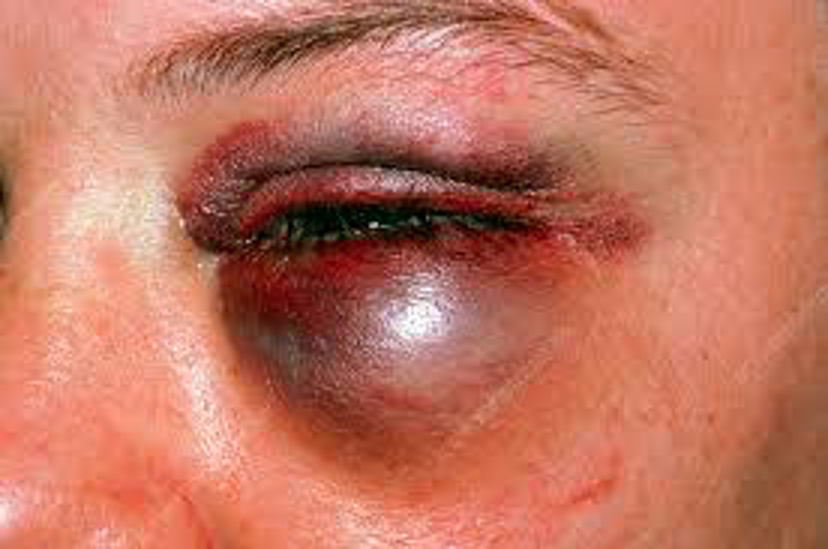

(228, 384, 3)
(228, 384, 3)


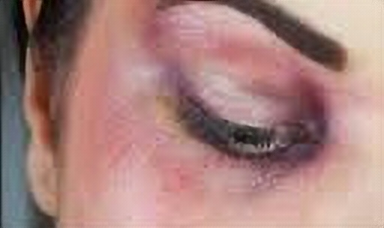

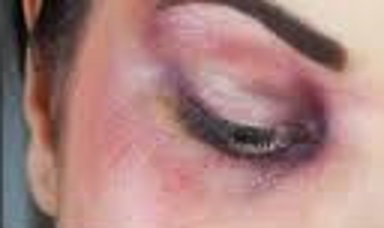

(504, 900, 3)
(504, 900, 3)


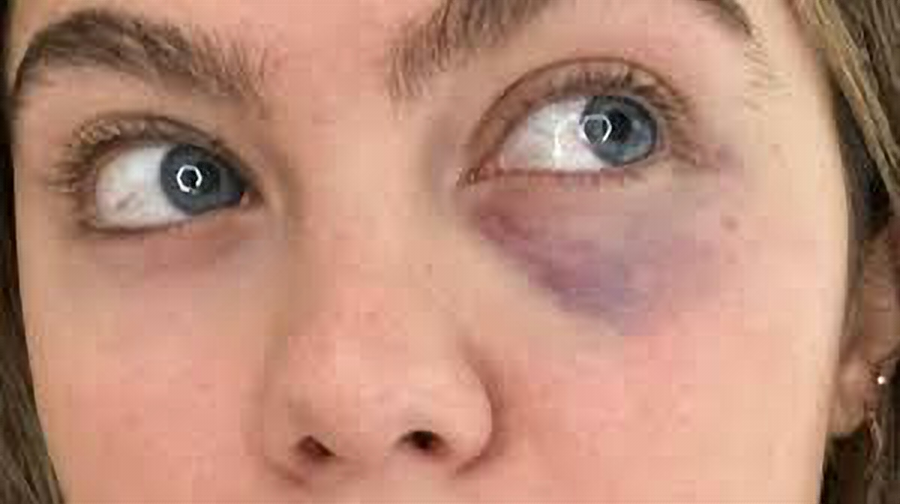

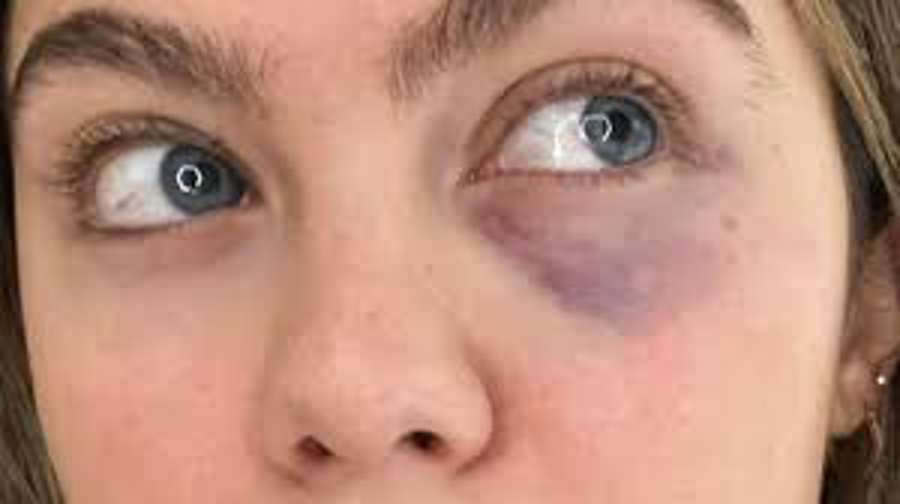

(603, 750, 3)
(603, 750, 3)


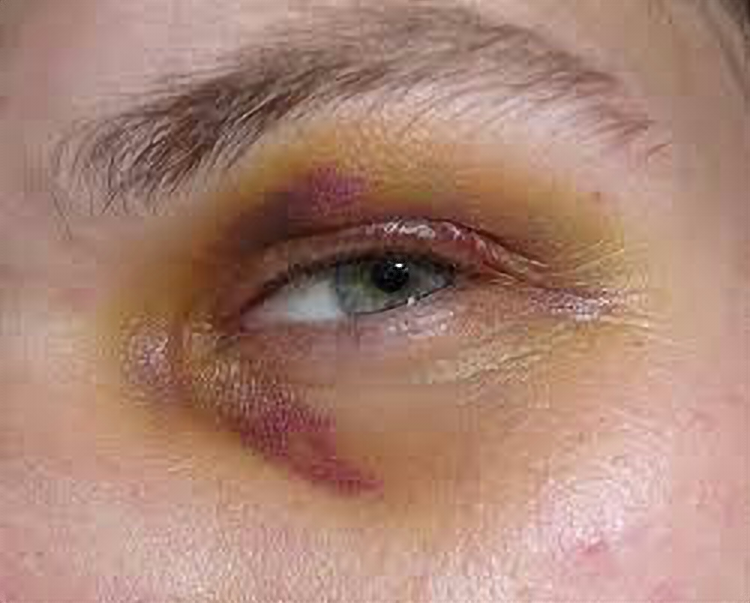

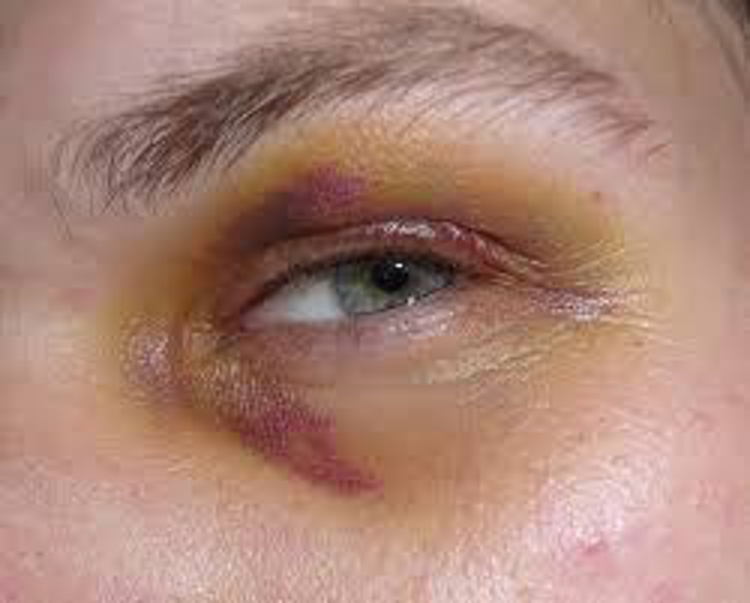

(219, 219, 3)
(219, 219, 3)


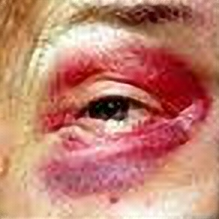

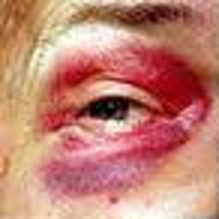

(582, 777, 3)
(582, 777, 3)


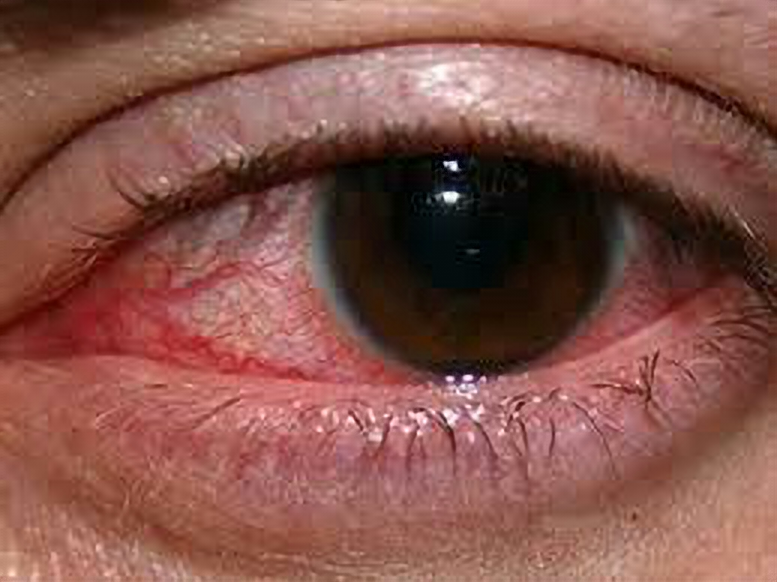

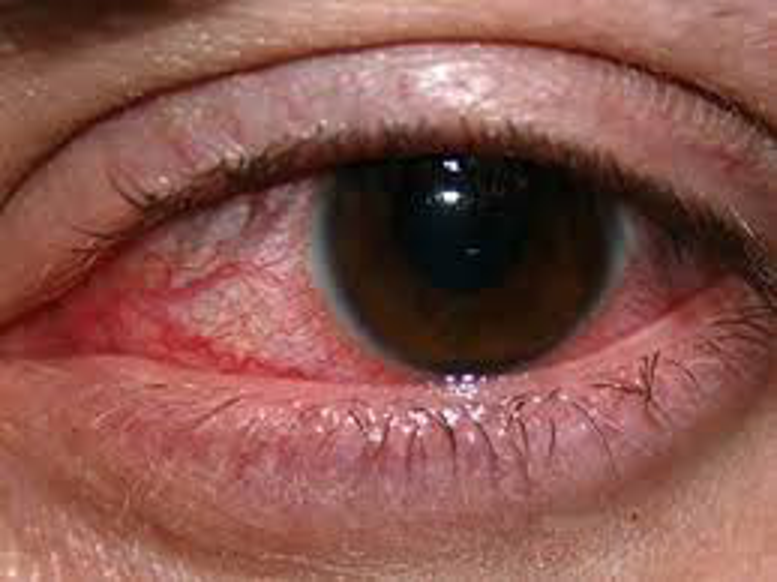

In [ ]:
#img = load_img(test_img_path)

i=0
for name in file:
  if name[-1]=='g' and i<10:
    src = os.path.join(path, name)

    img = load_img(src)    #이미지

    '''
    lowres_input = get_lowres_image(img, upscale_factor)     #1/3크기로 줄이기
    w = lowres_input.size[0] * upscale_factor     #원래 가로크기
    #print(w)
    h = lowres_input.size[1] * upscale_factor   #원래 세로크기
    #print(h)
    highres_img = img.resize((w, h))     #원래크기로 만들기
    #predict = upscale_image(model, lowres_input)   #1/3크기로 된걸 모델에 넣기
    lowres_img = lowres_input.resize((w, h))    #1/3크기로 된걸 그냥 다시 원래 크기로 늘리기

    lowres_img_arr = img_to_array(lowres_img)   
    print(lowres_img_arr.shape)
    highres_img_arr = img_to_array(highres_img)
    print(highres_img_arr.shape)
    predictt_img_arr = img_to_array(predict)
    print(predictt_img_arr.shape)
    '''

    prediction = upscale_image(model, img)         #원래 이미지를 모델에 넣어서 3배로 만들기
    lowres_img=img.resize((img.size[0]*3, img.size[1]*3),PIL.Image.BICUBIC,)    #걍 세배로 늘리기
    img_array = img_to_array(prediction)
    lowres_img_array = img_to_array(lowres_img)

    print(img_array.shape)
    print(lowres_img_array.shape)

    img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)   #색 바꾸기
    lowres_img_array = cv2.cvtColor(lowres_img_array, cv2.COLOR_BGR2RGB)   #색 바꾸기

    dst = name + '_resol.jpg'
    dst = os.path.join(path,dst)
    cv2_imshow(img_array)
    cv2_imshow(lowres_img_array)
    i+=1
    #cv2.imwrite(dst, img_array)   #변형된 이미지 저장



(300, 300, 3)
(300, 300, 3)


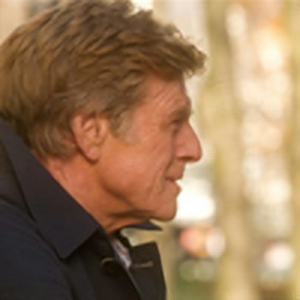

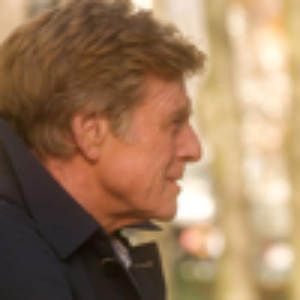

True

In [ ]:
#하나의 이미지 확인
img = load_img('/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/normal_face_150.jpg')    #이미지

prediction = upscale_image(model, img)         #원래 이미지를 모델에 넣어서 3배로 만들기
lowres_img=img.resize((img.size[0]*3, img.size[1]*3),PIL.Image.BICUBIC,)    #걍 세배로 늘리기
#lowres_img=img.resize((img.size[0]*3, img.size[1]*3),PIL.Image.BILINEAR,)    #걍 세배로 늘리기

img_array = img_to_array(prediction)
lowres_img_array = img_to_array(lowres_img)

print(img_array.shape)
print(lowres_img_array.shape)

img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)   #색 바꾸기
lowres_img_array = cv2.cvtColor(lowres_img_array, cv2.COLOR_BGR2RGB)   #색 바꾸기


cv2_imshow(img_array)
cv2_imshow(lowres_img_array)

cv2.imwrite('/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/rrrreeee.jpg', img_array)
cv2.imwrite('/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/jjjjuuuu.jpg', lowres_img_array)





- https://pgmaru.tistory.com/39
- https://towardsdatascience.com/image-processing-with-python-blurring-and-sharpening-for-beginners-3bcebec0583a

: 이거나중에 해보기


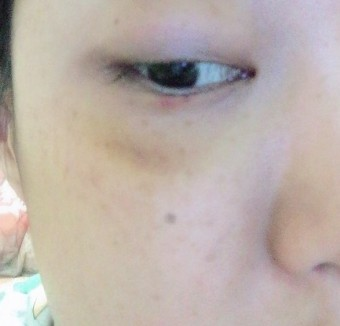

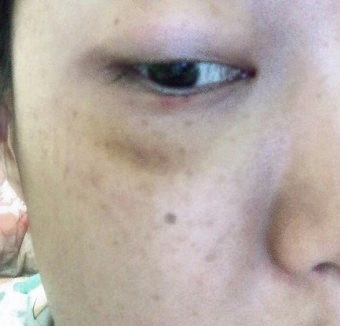

-1

In [ ]:
#색깔 대비 뚜렷하게 해주기
#https://bkshin.tistory.com/entry/OpenCV-10-%ED%9E%88%EC%8A%A4%ED%86%A0%EA%B7%B8%EB%9E%A8
import cv2

def img_Contrast(img):
  lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
  l, a, b = cv2.split(lab)
  clahe = cv2.createCLAHE(clipLimit=1.2, tileGridSize=(3, 3))  #cliplimits3.0 tileGridSize:8,8  
  cl = clahe.apply(l)
  limg = cv2.merge((cl, a, b))
  final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
  return final

img = cv2.imread('/content/drive/Shareddrives/BME캡스톤/data/data_final/eye_bruise_diagnosis/eyes_bruise/eyes_bruise_78.jpg') 
cv2_imshow(img) 

img_c = img_Contrast(img) 
cv2_imshow(img_c) 
cv2.imwrite('/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/oooo.jpg', img)
cv2.imwrite('/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/cccc.jpg', img_c)

cv2.waitKey(0)



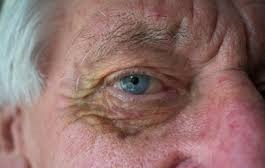

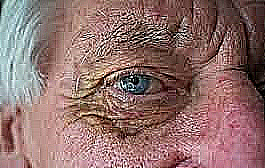

In [ ]:
#sharpening
img1 = cv2.imread('/content/drive/Shareddrives/BME캡스톤/data/data_final/eye_bruise_diagnosis/eyes_bruise/eyes_bruise_1.jpg',1)
cv2_imshow(img1)

# Creating our sharpening filter
filter = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
# Applying cv2.filter2D function on our Cybertruck image
sharpen_img_1=cv2.filter2D(img1,-1,filter)
cv2_imshow(sharpen_img_1)
#cv2.imwrite('/content/drive/Shareddrives/BME캡스톤/code/sumin/resolution/eb9resol_sharpening.jpg', sharpen_img_1)


